In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/house-price-prediction-challenge/sample_submission.csv
/kaggle/input/house-price-prediction-challenge/train.csv
/kaggle/input/house-price-prediction-challenge/test.csv


In [2]:
!pip install ydata-profiling category-encoders lightgbm

In [3]:
import pandas as pd
from ydata_profiling import ProfileReport
import plotly.express as px

from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split, GridSearchCV

from category_encoders import TargetEncoder, WOEEncoder
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler,RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

from lightgbm import LGBMRegressor

## Problem Statement
The real estate market is a complex and dynamic environment influenced by a multiple  factors including location, property size, amenities, market demand and more. Accurately predicting house prices is crucial for various stakeholders including buyers, sellers, real estate agents, and investors to make informed decisions. 

The primary objective of this project is to develop a robust and accurate machine learning model that can predict house prices with a high degree of precision. 

In [4]:
df = pd.read_csv("/kaggle/input/house-price-prediction-challenge/train.csv")
df.head()

,POSTED_BY,UNDER_CONSTRUCTION,RERA,BHK_NO.,BHK_OR_RK,SQUARE_FT,READY_TO_MOVE,RESALE,ADDRESS,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS)
0,Owner,0,0,2,BHK,1300.236407,1,1,"Ksfc Layout,Bangalore",12.969910,77.597960,55.0
1,Dealer,0,0,2,BHK,1275.000000,1,1,"Vishweshwara Nagar,Mysore",12.274538,76.644605,51.0
2,Owner,0,0,2,BHK,933.159722,1,1,"Jigani,Bangalore",12.778033,77.632191,43.0
3,Owner,0,1,2,BHK,929.921143,1,1,"Sector-1 Vaishali,Ghaziabad",28.642300,77.344500,62.5
4,Dealer,1,0,2,BHK,999.009247,0,1,"New Town,Kolkata",22.592200,88.484911,60.5


### Pandas Profiling Report

In [5]:
profile = ProfileReport(df, title="Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Summary of pandas profiling
Created a Pandas Profiling Report which gives insights for each variable .
1. 0% Missing Values for all the Variables
2. RERA Means -- Real Estate Regulatory Authority 
3. All most all the values are BHK in BHK_OR_RK Variable 
4. READY_TO_MOVE AND UNDER_CONSTRUCTION are giving same information , whether the house is under construction or ready to move
5. 97% of the houses are for RESALE
6. 401 rows are duplicated

## EDA

In [6]:
print(f"The Number of data points in the data is {df.shape[0]}")
print(f"The Number of Independent variable in the data is {df.shape[1]-1}")
print("There are 7 Categorical Variables, 4 Numerical Variables to Predict the price of the House")
print(f"Number of duplicate rows are {df.duplicated().sum()}")

The Number of data points in the data is 29451
The Number of Independent variable in the data is 11
There are 7 Categorical Variables, 4 Numerical Variables to Predict the price of the House
Number of duplicate rows are 401


## Data Preprocessing

In [7]:
df = df[df['BHK_OR_RK']=="BHK"]
df.drop(['BHK_OR_RK'],axis=1,inplace=True)
df["UNDER_CONSTRUCTION"] = df["UNDER_CONSTRUCTION"].astype(str)
df["RERA"] = df["RERA"].astype(str)
df["READY_TO_MOVE"] = df["READY_TO_MOVE"].astype(str)
df["RESALE"] = df["RESALE"].astype(str)

# preprocessing included after uni variate Analysis
df = df[(df['SQUARE_FT']<5463)&(df['SQUARE_FT']>=300)] # 99th percentile value is 5463 and Minimum Sqft for a 1 BHk is 300
df = df[df['BHK_NO.'].isin([1,2,3,4])] #1,2,3 and 4 BHK's Contribute to 99.03 % of Data Points

# 'UNDER_CONSTRUCTION','READY_TO_MOVE' are complementary columns-- removing  UNDER_CONSTRUCTION Column
df.drop(["UNDER_CONSTRUCTION"],axis=1,inplace=True)
df["BHK_NO."] = df["BHK_NO."].astype(str)

df["ADDRESS"]=df["ADDRESS"].apply(lambda x : x.lower())

# Extracing City from the Address 
df['city'] = df['ADDRESS'].apply(lambda x : x.replace(",,",",").split(',')[-1])

# Extracing City from the Address 
df['area'] = df['ADDRESS'].apply(lambda x : " ".join(x.replace(",,",",").split(',')[:-1]))

df.shape

/tmp/ipykernel_18/2533095400.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(['BHK_OR_RK'],axis=1,inplace=True)
/tmp/ipykernel_18/2533095400.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["UNDER_CONSTRUCTION"] = df["UNDER_CONSTRUCTION"].astype(str)
/tmp/ipykernel_18/2533095400.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returnin

(28836, 12)

### Data Pre Processing Summary
1. Removed the Under Construction Column, since its the counter part of READY_TO_MOVE
2. Square Ft has outliers and remove the 0.1 % values i.e values greater than 5463 and lower than 300(the min sqft of 1bhk is around 300)
3. Considering BHK No's 1,2,3,4 . These houses contribute to 99.03 % houses
4. Extracted City and Area from the ADDRESS column of the data

In [8]:
df.head()

,POSTED_BY,RERA,BHK_NO.,SQUARE_FT,READY_TO_MOVE,RESALE,ADDRESS,LONGITUDE,LATITUDE,TARGET(PRICE_IN_LACS),city,area
0,Owner,0,2,1300.236407,1,1,"ksfc layout,bangalore",12.969910,77.597960,55.0,bangalore,ksfc layout
1,Dealer,0,2,1275.000000,1,1,"vishweshwara nagar,mysore",12.274538,76.644605,51.0,mysore,vishweshwara nagar
2,Owner,0,2,933.159722,1,1,"jigani,bangalore",12.778033,77.632191,43.0,bangalore,jigani
3,Owner,1,2,929.921143,1,1,"sector-1 vaishali,ghaziabad",28.642300,77.344500,62.5,ghaziabad,sector-1 vaishali
4,Dealer,0,2,999.009247,0,1,"new town,kolkata",22.592200,88.484911,60.5,kolkata,new town


### Uni Variate Analysis

In [9]:
px.box(df['TARGET(PRICE_IN_LACS)'],title = "Distribution of TARGET(PRICE_IN_LACS)")

In [10]:
df['TARGET(PRICE_IN_LACS)'].describe()

count    28836.000000
mean        96.410453
std        142.536333
min          0.250000
25%         37.700000
50%         60.450000
75%        100.000000
max       5500.000000
Name: TARGET(PRICE_IN_LACS), dtype: float64

In [11]:
variable_name = "POSTED_BY"
dist_df= (df[variable_name].value_counts()/df.shape[0]).reset_index(name='perc_of_data_points')
dist_df['perc_of_data_points']=dist_df['perc_of_data_points']*100
px.bar(dist_df,x=variable_name,y='perc_of_data_points',text_auto=True,
      title = f"Distribution of Categories of {variable_name}")

In [12]:
variable_name = "RERA"
dist_df= (df[variable_name].value_counts()/df.shape[0]).reset_index(name='perc_of_data_points')
dist_df['perc_of_data_points']=dist_df['perc_of_data_points']*100
px.bar(dist_df,x=variable_name,y='perc_of_data_points',text_auto=True,
      title = f"Distribution of Categories of {variable_name}")

In [13]:
variable_name = "BHK_NO."
dist_df= (df[variable_name].value_counts()/df.shape[0]).reset_index(name='perc_of_data_points')
dist_df['perc_of_data_points']=dist_df['perc_of_data_points']*100
px.bar(dist_df,x=variable_name,y='perc_of_data_points',text_auto=True,
      title = f"Distribution of Categories of {variable_name}")

In [14]:
variable_name = "READY_TO_MOVE"
dist_df= (df[variable_name].value_counts()/df.shape[0]).reset_index(name='perc_of_data_points')
dist_df['perc_of_data_points']=dist_df['perc_of_data_points']*100
px.bar(dist_df,x=variable_name,y='perc_of_data_points',text_auto=True,\
       title = f"Distribution of Categories of {variable_name}")

In [15]:
variable_name = "RESALE"
dist_df= (df[variable_name].value_counts()/df.shape[0]).reset_index(name='perc_of_data_points')
dist_df['perc_of_data_points']=dist_df['perc_of_data_points']*100
px.bar(dist_df,x=variable_name,y='perc_of_data_points',text_auto=True)

In [16]:
px.box(df['LONGITUDE'],title ="Distribution of Longitude")

In [17]:
px.box(df['LATITUDE'],title = "Distribution of Latitude")

In [18]:
print(f"Number of Unique Addresses is {df['ADDRESS'].apply(lambda x: x.lower()).nunique()} ")

Number of Unique Addresses is 6739 


In [19]:
px.box(df['SQUARE_FT'],title ="Distribution of the Square Feat Variable")

In [20]:
df['SQUARE_FT'].describe()

count    28836.000000
mean      1277.864555
std        609.317054
min        300.000000
25%        900.000000
50%       1167.554946
75%       1525.262154
max       5449.888277
Name: SQUARE_FT, dtype: float64

In [21]:
variable_name = "city"
dist_df= (df[variable_name].value_counts()/df.shape[0]).reset_index(name='perc_of_data_points')
dist_df['perc_of_data_points']=dist_df['perc_of_data_points']*100
px.bar(dist_df,x=variable_name,y='perc_of_data_points',text_auto=True,
      title = f"Distribution of Categories of {variable_name}")

In [22]:
dist_df['cum_perc'] = dist_df['perc_of_data_points'].cumsum()
dist_df

,city,perc_of_data_points,cum_perc
0,bangalore,14.814815,14.814815
1,lalitpur,10.032598,24.847413
2,mumbai,6.876821,31.724234
3,pune,6.797059,38.521293
4,noida,5.992509,44.513802
...,...,...,...
246,dibrugarh,0.003468,99.986128
247,machilipatnam,0.003468,99.989596
248,idukki,0.003468,99.993064
249,korba,0.003468,99.996532


In [23]:
print(f"{dist_df[dist_df['cum_perc']<=95].shape[0]} cities contribute to 98 % of Houses ")

64 cities contribute to 98 % of Houses 


In [24]:
variable_name = "area"
dist_df= (df[variable_name].value_counts()/df.shape[0]).reset_index(name='perc_of_data_points')
dist_df['perc_of_data_points']=dist_df['perc_of_data_points']*100
px.bar(dist_df,x=variable_name,y='perc_of_data_points',text_auto=True,
      title = f"Distribution of Categories of {variable_name}")

In [25]:
dist_df['cum_perc'] = dist_df['perc_of_data_points'].cumsum()
dist_df

,area,perc_of_data_points,cum_perc
0,zirakpur,1.945485,1.945485
1,whitefield,0.790678,2.736163
2,raj nagar extension,0.745596,3.481759
3,thane west,0.565266,4.047025
4,mulund (west),0.523651,4.570676
...,...,...,...
5744,indramani nagar,0.003468,99.986128
5745,t k reddy layout,0.003468,99.989596
5746,professors colony,0.003468,99.993064
5747,sashtripuram,0.003468,99.996532


In [26]:
print(f"{dist_df[dist_df['cum_perc']<=95].shape[0]} areas contribute to 95 % of Houses ")

4307 areas contribute to 95 % of Houses 


In [27]:
df['area'].nunique()

5749

#### Summary of Univariate Analysis

1. Only two percent houses are posted by Builder 
2. 31 % of houses posted are approved by RERA
3. 82% of houses are ready to move
4. Number of Unique Addresses is 6739 
5. 64 cities contribute to 98 % of Houses
6. 5749 unique areas in dataset
7. 4307 areas contribute to 95 % of Houses

### Bi Variate Analysis

In [28]:
variable_name = 'POSTED_BY'
px.box(df[df["TARGET(PRICE_IN_LACS)"]<1000],x=variable_name,y="TARGET(PRICE_IN_LACS)")

In [29]:
variable_name = 'RERA'
px.box(df[df["TARGET(PRICE_IN_LACS)"]<1000],x=variable_name,y="TARGET(PRICE_IN_LACS)")

In [30]:
variable_name = 'BHK_NO.'
px.box(df[df["TARGET(PRICE_IN_LACS)"]<1000],x=variable_name,y="TARGET(PRICE_IN_LACS)")

In [31]:
variable_name = 'READY_TO_MOVE'
px.box(df[df["TARGET(PRICE_IN_LACS)"]<1000],x=variable_name,y="TARGET(PRICE_IN_LACS)")

In [32]:
variable_name = 'RESALE'
px.box(df[df["TARGET(PRICE_IN_LACS)"]<1000],x=variable_name,y="TARGET(PRICE_IN_LACS)")

In [33]:
px.imshow(df[["SQUARE_FT","TARGET(PRICE_IN_LACS)","LONGITUDE","LATITUDE"]].corr(), text_auto=True)

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



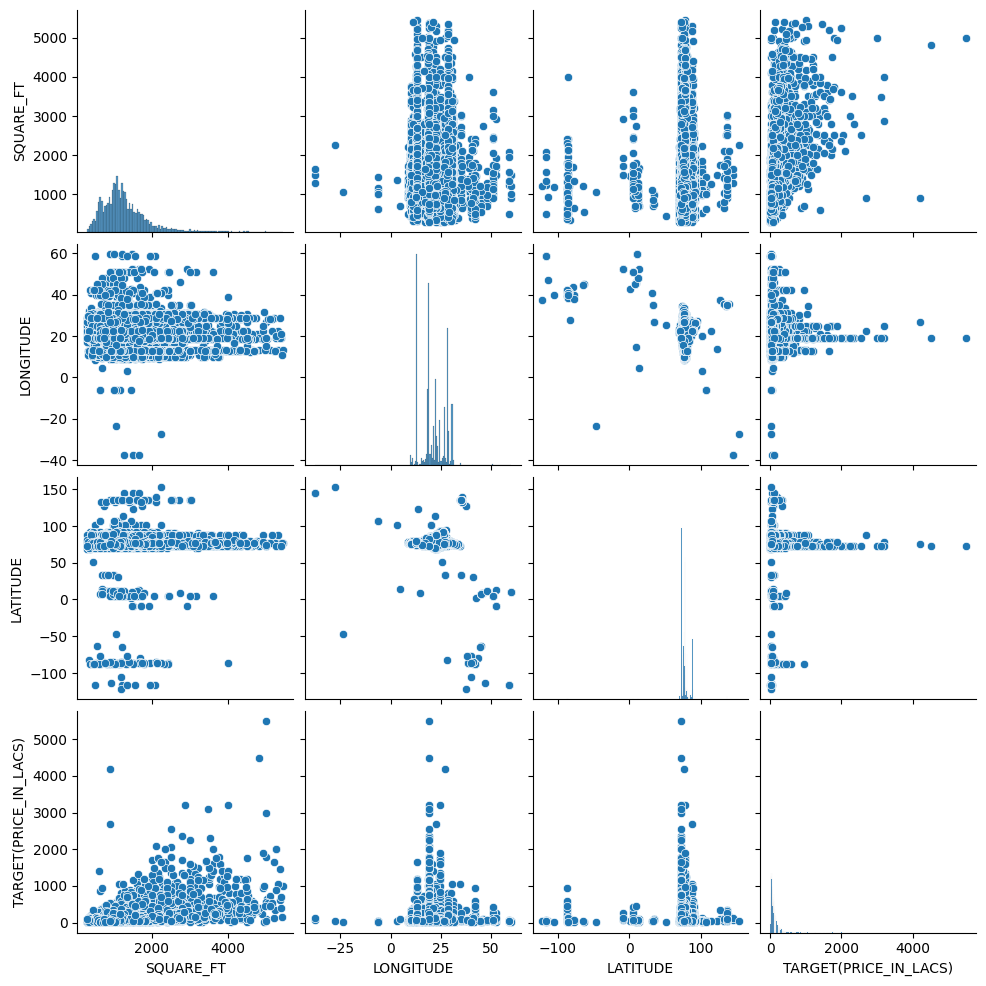

In [34]:
import seaborn as sns
sns.pairplot(df)

In [35]:
cat_cols = df.select_dtypes(include='object').drop(['ADDRESS','city','area'],axis=1).columns
from itertools import combinations
for col1,col2 in combinations(cat_cols,r=2):
    temp_df= pd.crosstab(df[col1],df[col2],\
                         values=df["TARGET(PRICE_IN_LACS)"],aggfunc=pd.Series.count)
    cols = temp_df.columns
    temp_df['Total'] = temp_df.sum(axis=1)
    for col in temp_df.columns :
        temp_df[col] = round(temp_df[col]/temp_df["Total"],4)*100
#     temp_df.drop('Total',axis=1,inplace=True)
    fig = px.imshow(temp_df,text_auto=True,title = f"{col1} vs {col2} w.r.t Count ")
    fig.show()

#### Summary of Bi Variate Analysis
1. Dealer Posted Houses have high prices compared to Owner and Builder
2. RERA Approved Houses Have high price compared to un approved
3. Median Prices of 4 BHK  >  3 BHK > 2 BHK  > 1  BHK
4. Price and Sqft are 47% correlated
1. 66 % houses posted by builder are RERA Approved
2. Only 15 % houses posted by Owner are RERA Approved
3. Only 30% of houses posted by builder are Ready to Move
4. 94 % of houses posted by Owner are Ready to Move
5. Less than 1% houses posted by Owner are for Resale
6. But almost all the houses posted by Owner are for Resale

## Multi Variate Analysis

In [36]:
cat_cols = df.select_dtypes(include='object').drop(['ADDRESS','city','area'],axis=1).columns 
for col1, col2 in combinations(cat_cols,r=2) :
    fig = px.box(df[df["TARGET(PRICE_IN_LACS)"]<1000],x =col1,y="TARGET(PRICE_IN_LACS)",color=col2,\
          title =f"Comparison of the distribution of TARGET(PRICE_IN_LACS)  w.r.t {col1} and {col2}")
    fig.show()

/opt/conda/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



/opt/conda/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



/opt/conda/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



/opt/conda/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



/opt/conda/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



/opt/conda/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



/opt/conda/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



/opt/conda/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



/opt/conda/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



/opt/conda/lib/python3.10/site-packages/plotly/express/_core.py:2065: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



## Modelling

In [37]:
target_variable = "TARGET(PRICE_IN_LACS)"
xtrain, xvalid,ytrain,yvalid = train_test_split(df.drop(target_variable,axis=1),df[target_variable],\
                                                test_size = 0.2,random_state=42)

In [38]:
xtrain.shape, xvalid.shape, ytrain.shape,yvalid.shape

((23068, 11), (5768, 11), (23068,), (5768,))

In [39]:
cat_cols = ["POSTED_BY","city",'area']
xtrain[["RERA","BHK_NO.","READY_TO_MOVE","RESALE"]]=xtrain[["RERA","BHK_NO.","READY_TO_MOVE","RESALE"]].astype(int)
xvalid[["RERA","BHK_NO.","READY_TO_MOVE","RESALE"]]=xvalid[["RERA","BHK_NO.","READY_TO_MOVE","RESALE"]].astype(int)
num_cols=["RERA","BHK_NO.","READY_TO_MOVE","RESALE",'SQUARE_FT','LONGITUDE','LATITUDE']

In [40]:
xtrain.drop(['ADDRESS'],axis=1,inplace=True)
xvalid.drop(['ADDRESS'],axis=1,inplace=True)

In [41]:
transformers = []
transformers.append(("num_mean_imp",SimpleImputer(strategy="median"),num_cols))
transformers.append(("cat_te",TargetEncoder(smoothing=10),cat_cols))
preprocessor = ColumnTransformer(transformers, remainder="passthrough",verbose=True)

In [42]:
model = DecisionTreeRegressor()
model_pipeline = Pipeline([("preprocessor",preprocessor),("model",model)])

model_pipeline.fit(xtrain,ytrain)
from sklearn.metrics import r2_score
yvalid_pred = model_pipeline.predict(xvalid)
valid_r2_score = r2_score(y_true=yvalid,y_pred=yvalid_pred)

ytrain_pred = model_pipeline.predict(xtrain)
train_r2_score = r2_score(y_true=ytrain,y_pred=ytrain_pred)

print(f"The train data  r2 score is {train_r2_score}")
print(f"The validation data  r2 score is {valid_r2_score}")

[ColumnTransformer] .. (1 of 2) Processing num_mean_imp, total=   0.0s
[ColumnTransformer] ........ (2 of 2) Processing cat_te, total=   0.1s
The train data  r2 score is 0.9999624951425792
The validation data  r2 score is 0.5915925969921431


In [43]:
# from sklearn.model_selection import GridSearchCV
# param_grid = [{
#               "max_depth" : [2,4,6,8],
#               "max_features" : [4,6,8,10],
# #     "min_samples_leaf":range(4,11,2),
# #     "min_samples_split":range(4,11,2)
# #             "criterion":['absolute_error','squared_error']
#               }]
# train_data = preprocessor.fit_transform(xtrain,ytrain)
# # train_data = standardizer.fit_transform(train_data,ytrain)
# train_data = pd.DataFrame(train_data,columns=num_cols+cat_cols)
# dtr = DecisionTreeRegressor()

In [44]:
# gs = GridSearchCV(estimator=dtr,param_grid= param_grid,cv=10 ,n_jobs=-1)
# gs.fit(train_data,ytrain)
# gs_df = pd.DataFrame(gs.cv_results_).sort_values(by='rank_test_score')
# gs_df

In [45]:
# gs.best_params_

In [46]:
# Used the best
model = DecisionTreeRegressor(max_depth=8, max_features = 8,min_samples_leaf=6)
model_pipeline = Pipeline([("preprocessor",preprocessor),("model",model)])

model_pipeline.fit(xtrain,ytrain)
from sklearn.metrics import r2_score
yvalid_pred = model_pipeline.predict(xvalid)
valid_r2_score = r2_score(y_true=yvalid,y_pred=yvalid_pred)

ytrain_pred = model_pipeline.predict(xtrain)
train_r2_score = r2_score(y_true=ytrain,y_pred=ytrain_pred)

print(f"The train data  r2 score is {train_r2_score}")
print(f"The validation data  r2 score is {valid_r2_score}")

[ColumnTransformer] .. (1 of 2) Processing num_mean_imp, total=   0.0s
[ColumnTransformer] ........ (2 of 2) Processing cat_te, total=   0.2s
The train data  r2 score is 0.8513912689064094
The validation data  r2 score is 0.648164496704015


In [47]:
model = RandomForestRegressor()
model_pipeline = Pipeline([("preprocessor",preprocessor),("model",model)])

model_pipeline.fit(xtrain,ytrain)
from sklearn.metrics import r2_score
yvalid_pred = model_pipeline.predict(xvalid)
valid_r2_score = r2_score(y_true=yvalid,y_pred=yvalid_pred)

ytrain_pred = model_pipeline.predict(xtrain)
train_r2_score = r2_score(y_true=ytrain,y_pred=ytrain_pred)

print(f"The train data  r2 score is {train_r2_score}")
print(f"The validation data  r2 score is {valid_r2_score}")

[ColumnTransformer] .. (1 of 2) Processing num_mean_imp, total=   0.0s
[ColumnTransformer] ........ (2 of 2) Processing cat_te, total=   0.2s
The train data  r2 score is 0.9770106325983143
The validation data  r2 score is 0.6946424921745251


In [48]:
# from sklearn.model_selection import GridSearchCV
# param_grid = [{"n_estimators" : [10,25,50,75,100],
#               "max_depth" : [2,4,6,8],
#               "max_features" : [4,6,8,10]
#               }]
# train_data = preprocessor.fit_transform(xtrain,ytrain)
# # train_data = standardizer.fit_transform(train_data,ytrain)
# train_data = pd.DataFrame(train_data,columns=num_cols+cat_cols)
# rfc = RandomForestRegressor()

In [49]:
# gs = GridSearchCV(estimator=rfc,param_grid= param_grid,cv=10 )
# gs.fit(train_data,ytrain)
# gs_df = pd.DataFrame(gs.cv_results_).sort_values(by='rank_test_score')
# gs_df

In [50]:
model = RandomForestRegressor(n_estimators=75,max_depth=10,max_features=6)
model_pipeline = Pipeline([("preprocessor",preprocessor),("model",model)])

model_pipeline.fit(xtrain,ytrain)
from sklearn.metrics import r2_score
yvalid_pred = model_pipeline.predict(xvalid)
valid_r2_score = r2_score(y_true=yvalid,y_pred=yvalid_pred)

ytrain_pred = model_pipeline.predict(xtrain)
train_r2_score = r2_score(y_true=ytrain,y_pred=ytrain_pred)

print(f"The train data  r2 score is {train_r2_score}")
print(f"The validation data  r2 score is {valid_r2_score}")

[ColumnTransformer] .. (1 of 2) Processing num_mean_imp, total=   0.0s
[ColumnTransformer] ........ (2 of 2) Processing cat_te, total=   0.1s
The train data  r2 score is 0.9475772227392937
The validation data  r2 score is 0.6838395540340247


In [51]:
model = LGBMRegressor()
model_pipeline = Pipeline([("preprocessor",preprocessor),("model",model)])

model_pipeline.fit(xtrain,ytrain)
from sklearn.metrics import r2_score
yvalid_pred = model_pipeline.predict(xvalid)
valid_r2_score = r2_score(y_true=yvalid,y_pred=yvalid_pred)

ytrain_pred = model_pipeline.predict(xtrain)
train_r2_score = r2_score(y_true=ytrain,y_pred=ytrain_pred)

print(f"The train data  r2 score is {train_r2_score}")
print(f"The validation data  r2 score is {valid_r2_score}")

[ColumnTransformer] .. (1 of 2) Processing num_mean_imp, total=   0.0s
[ColumnTransformer] ........ (2 of 2) Processing cat_te, total=   0.1s
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004051 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1211
[LightGBM] [Info] Number of data points in the train set: 23068, number of used features: 10
[LightGBM] [Info] Start training from score 96.169847
The train data  r2 score is 0.9097583801290625
The validation data  r2 score is 0.6884536366041638


In [52]:
model = LGBMRegressor(n_estimators=75,max_depth=8,max_features=6)
model_pipeline = Pipeline([("preprocessor",preprocessor),("model",model)])

model_pipeline.fit(xtrain,ytrain)
from sklearn.metrics import r2_score
yvalid_pred = model_pipeline.predict(xvalid)
valid_r2_score = r2_score(y_true=yvalid,y_pred=yvalid_pred)

ytrain_pred = model_pipeline.predict(xtrain)
train_r2_score = r2_score(y_true=ytrain,y_pred=ytrain_pred)

print(f"The train data  r2 score is {train_r2_score}")
print(f"The validation data  r2 score is {valid_r2_score}")

[ColumnTransformer] .. (1 of 2) Processing num_mean_imp, total=   0.0s
[ColumnTransformer] ........ (2 of 2) Processing cat_te, total=   0.1s
[LightGBM] [Warning] Unknown parameter: max_features
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Unknown parameter: max_features
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004523 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1211
[LightGBM] [Info] Number of data points in the train set: 23068, number of used features: 10
[LightGBM] [Info] Start training from score 96.169847
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

In [53]:
# from sklearn.model_selection import GridSearchCV
# param_grid = [{ "n_estimators" : [10,25,50,75,100],
#               "max_depth" : [2,4,6,8],
#               "colsample_bytree" : np.arange(0.6,1.0,0.1),
#                "reg_alpha" : np.arange(0.1,0.5,0.1),
#                "reg_lambda" : np.arange(0.1,0.5,0.1)
#               }]
# train_data = preprocessor.fit_transform(xtrain,ytrain)
# train_data = pd.DataFrame(train_data,columns=num_cols+cat_cols)
# lgbr = LGBMRegressor()
# gs = GridSearchCV(estimator=lgbr,param_grid= param_grid,cv=10 ,scoring='r2')
# gs.fit(train_data,ytrain)
# gs_df = pd.DataFrame(gs.cv_results_).sort_values(by='rank_test_score')
# gs_df

In [54]:
# gs_df.best_params_,gs_df.best_score_

In [55]:
model = LGBMRegressor(n_estimators=100,max_depth=6,colsample_bytree=0.9,reg_alpha=0.4,num_leaves=100)
model_pipeline = Pipeline([("preprocessor",preprocessor),("model",model)])

model_pipeline.fit(xtrain,ytrain)
from sklearn.metrics import r2_score
yvalid_pred = model_pipeline.predict(xvalid)
valid_r2_score = r2_score(y_true=yvalid,y_pred=yvalid_pred)

ytrain_pred = model_pipeline.predict(xtrain)
train_r2_score = r2_score(y_true=ytrain,y_pred=ytrain_pred)

print(f"The train data  r2 score is {train_r2_score}")
print(f"The validation data  r2 score is {valid_r2_score}")

[ColumnTransformer] .. (1 of 2) Processing num_mean_imp, total=   0.0s
[ColumnTransformer] ........ (2 of 2) Processing cat_te, total=   0.1s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004490 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1211
[LightGBM] [Info] Number of data points in the train set: 23068, number of used features: 10
[LightGBM] [Info] Start training from score 96.169847
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

In [56]:
train_data = preprocessor.fit_transform(xtrain,ytrain)
train_data = pd.DataFrame(train_data,columns=num_cols+cat_cols)
lgbr = LGBMRegressor()
lgbr.fit(train_data,ytrain)

[ColumnTransformer] .. (1 of 2) Processing num_mean_imp, total=   0.0s
[ColumnTransformer] ........ (2 of 2) Processing cat_te, total=   0.1s
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1211
[LightGBM] [Info] Number of data points in the train set: 23068, number of used features: 10
[LightGBM] [Info] Start training from score 96.169847


LGBMRegressor()

In [57]:
fi_df_list = []
for i in range(len(lgbr.feature_importances_)):
    fi_df_list.append([lgbr.feature_importances_[i],lgbr.feature_name_[i]])
fi_df = pd.DataFrame(fi_df_list , columns= ["feature_importance","feature"]).sort_values(by='feature_importance',ascending=False)
px.bar(fi_df,x="feature",y="feature_importance",text_auto=True)

### Modelling Summary
1. We have seen distribution of the numerical variables w.r.t Target Variable. we haven't find any linear relationship. 
2. The number of Categorical Variables are more compared to Numerical Variables, so we haven't used Linear Regression for the Problem
3. I have started with Decision Tree , The r2 score is 0.6. I have used Grid Search for finding the best parameters and improved the r2 score by 0.02
4. I have used Random Forest  , The r2 score is 0.67. I have used Grid Search for finding the best parameters and improved the r2 score by 0.03. 
5. I have used LGBM  , The r2 score is 0.7. I have used Grid Search for finding the best parameters and improved the r2 score by 0.03.
6. The Final best r2 score is 0.73 and the best model is LGBM